In [189]:
import pandas as pd
import sqlite3

def create_connection(db_file, delete_db=False):
    import os
    if delete_db and os.path.exists(db_file):
        os.remove(db_file)

    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Exception as e:
        print(e)

    return conn


def create_table(conn, create_table_sql, drop_table_name=None):
    if drop_table_name: # You can optionally pass drop_table_name to drop the table. 
        try:
            c = conn.cursor()
            c.execute("""DROP TABLE IF EXISTS %s""" % (drop_table_name))
        except Exception as e:
            print(e)
    
    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Exception as e:
        print(e)
        
def execute_sql_statement(sql_statement, conn):
    cur = conn.cursor()
    cur.execute(sql_statement)

    rows = cur.fetchall()

    return rows

## Normalize Data

In [190]:
def normalize_data(filename):
    patient_data = []
    diabetic_pred = []
    with open(filename, 'r') as file:
        lines = file.readlines()
    
    for line in lines:
        patient_data.append(line.strip().split(',')[0:9])

    for line in lines:
        diabetic_pred.append(line.strip().split(',')[0:10:9])
    
    return (patient_data, diabetic_pred)

patient_data, diabetic_pred = normalize_data('diabetes.csv')

db_file = 'normalized.db'

### Patient Data

In [191]:
conn = create_connection(db_file)
cur = conn.cursor()
sql_create_pd = ''' CREATE TABLE IF NOT EXISTS PatientData (
                                PatientID INTEGER NOT NULL PRIMARY KEY,
                                Pregnancies INTEGER NOT NULL,
                                Glucose FLOAT NOT NULL,
                                BloodPressure INTEGER NOT NULL,
                                SkinThickness FLOAT NOT NULL,
                                Insulin FLOAT NOT NULL,
                                BMI FLOAT NOT NULL,
                                Pedigree FLOAT NOT NULL,
                                Age INTEGER NOT NULL);
                                '''

create_table(conn,sql_create_pd, True)

In [192]:
conn = create_connection(db_file)
cur = conn.cursor()
sql_insert_pd = ''' INSERT OR IGNORE INTO PatientData (
                          Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, Pedigree, Age) VALUES (?,?,?,?,?,?,?,?);
                        '''

patient_info = []

for patient in patient_data[1:]:
    preg = patient[1]
    gluc = patient[2]
    bp = patient[3]
    skinthic = patient[4]
    ins = patient[5]
    bmi = patient[6]
    pedi = patient[7]
    age = patient[8]
    patient_info.append((preg, gluc, bp, skinthic, ins, bmi, pedi, age))

cur.executemany(sql_insert_pd, patient_info)
conn.commit()
conn.close()

In [193]:
conn = create_connection(db_file)
sql = ''' SELECT * FROM PatientData '''
pd.read_sql_query(sql,conn)

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age
0,1,6,148.0,72,35.0,0.0,33.6,0.627,50
1,2,1,85.0,66,29.0,0.0,26.6,0.351,31
2,3,8,183.0,64,0.0,0.0,23.3,0.672,32
3,4,1,89.0,66,23.0,94.0,28.1,0.167,21
4,5,0,137.0,40,35.0,168.0,43.1,2.288,33
...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76,48.0,180.0,32.9,0.171,63
764,765,2,122.0,70,27.0,0.0,36.8,0.340,27
765,766,5,121.0,72,23.0,112.0,26.2,0.245,30
766,767,1,126.0,60,0.0,0.0,30.1,0.349,47


### Diabetes Prediction

In [194]:
diabetic_pred[0:5]

[['ï»¿PatientID', 'Outcome'],
 ['1', 'yes'],
 ['2', 'no'],
 ['3', 'yes'],
 ['4', 'no']]

In [195]:
conn = create_connection(db_file)
cur = conn.cursor()
sql_create_dp = ''' CREATE TABLE IF NOT EXISTS DiabetesPrediction (
                                PatientID INTEGER NOT NULL PRIMARY KEY,
                                DiabetesPred INTEGER NOT NULL);
                                '''

create_table(conn,sql_create_dp, True)

In [196]:
conn = create_connection(db_file)
cur = conn.cursor()
sql_insert_dp = ''' INSERT OR IGNORE INTO DiabetesPrediction (
                      DiabetesPred) VALUES (?);
                    '''

patient_info = []

for patient in diabetic_pred[1:]:
    outcome = patient[1]
    patient_info.append((outcome,))

cur.executemany(sql_insert_dp, patient_info)
conn.commit()
conn.close()

In [197]:
conn = create_connection(db_file)
sql = ''' SELECT * FROM DiabetesPrediction '''
pd.read_sql_query(sql,conn)

,PatientID,DiabetesPred
0,1,yes
1,2,no
2,3,yes
3,4,no
4,5,yes
...,...,...
763,764,no
764,765,no
765,766,no
766,767,yes


### Pull Data

In [198]:
conn = create_connection(db_file)
conn.close()

In [199]:
conn = create_connection(db_file)
cur = conn.cursor()
sql = ''' SELECT 
    PatientData.PatientID,
    Pregnancies,
    Glucose,
    BloodPressure,
    SkinThickness,
    Insulin,
    BMI,
    Pedigree,
    Age,
    DiabetesPred
FROM PatientData
INNER JOIN DiabetesPrediction AS dp
ON PatientData.PatientID = dp.PatientID
 '''
df = pd.read_sql_query(sql,conn)
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72,35.0,0.0,33.6,0.627,50,yes
1,2,1,85.0,66,29.0,0.0,26.6,0.351,31,no
2,3,8,183.0,64,0.0,0.0,23.3,0.672,32,yes
3,4,1,89.0,66,23.0,94.0,28.1,0.167,21,no
4,5,0,137.0,40,35.0,168.0,43.1,2.288,33,yes
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76,48.0,180.0,32.9,0.171,63,no
764,765,2,122.0,70,27.0,0.0,36.8,0.340,27,no
765,766,5,121.0,72,23.0,112.0,26.2,0.245,30,no
766,767,1,126.0,60,0.0,0.0,30.1,0.349,47,yes


## Setting up Dagshub and MLflow

In [200]:
import dagshub
dagshub.init(repo_owner='C-bundele', repo_name='Diabetes-EAS', mlflow=True)

Initialized MLflow to track repo "C-bundele/Diabetes-EAS"

Repository C-bundele/Diabetes-EAS initialized!

In [201]:
import mlflow

with mlflow.start_run():
  # Your training code here...
  mlflow.log_metric('accuracy', 42)
  mlflow.log_param('Param name', 'Value')

🏃 View run colorful-cub-230 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/7aa10eb8cfe0481389fceac352d2840f
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


## Experiment 1

In [202]:
df.head()

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72,35.0,0.0,33.6,0.627,50,yes
1,2,1,85.0,66,29.0,0.0,26.6,0.351,31,no
2,3,8,183.0,64,0.0,0.0,23.3,0.672,32,yes
3,4,1,89.0,66,23.0,94.0,28.1,0.167,21,no
4,5,0,137.0,40,35.0,168.0,43.1,2.288,33,yes


In [203]:
conn.close(
)

In [204]:
df.shape

(768, 10)

In [205]:
df.tail(10)

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
758,759,1,106.0,76,0.0,0.0,37.5,0.197,26,no
759,760,6,190.0,92,0.0,0.0,35.5,0.278,66,yes
760,761,2,88.0,58,26.0,16.0,28.4,0.766,22,no
761,762,9,170.0,74,31.0,0.0,44.0,0.403,43,yes
762,763,9,89.0,62,0.0,0.0,22.5,0.142,33,no
763,764,10,101.0,76,48.0,180.0,32.9,0.171,63,no
764,765,2,122.0,70,27.0,0.0,36.8,0.340,27,no
765,766,5,121.0,72,23.0,112.0,26.2,0.245,30,no
766,767,1,126.0,60,0.0,0.0,30.1,0.349,47,yes
767,768,1,93.0,70,31.0,0.0,30.4,0.315,23,no


In [206]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Basic information about the dataset
print(df.info())

# Display basic statistics
print(df.describe())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PatientID      768 non-null    int64  
 1   Pregnancies    768 non-null    int64  
 2   Glucose        768 non-null    float64
 3   BloodPressure  768 non-null    int64  
 4   SkinThickness  768 non-null    float64
 5   Insulin        768 non-null    float64
 6   BMI            768 non-null    float64
 7   Pedigree       768 non-null    float64
 8   Age            768 non-null    int64  
 9   DiabetesPred   768 non-null    object 
dtypes: float64(5), int64(4), object(1)
memory usage: 60.1+ KB
None
        PatientID  Pregnancies     Glucose  BloodPressure  SkinThickness  \
count  768.000000   768.000000  768.000000     768.000000     768.000000   
mean   384.500000     3.845052  120.894531      69.105469      20.536458   
std    221.846794     3.369578   31.972618      19.355807      15.95221

DISTRIBUTION ANALYSIS

In [207]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72,35.0,0.0,33.6,0.627,50,yes
1,2,1,85.0,66,29.0,0.0,26.6,0.351,31,no
2,3,8,183.0,64,0.0,0.0,23.3,0.672,32,yes
3,4,1,89.0,66,23.0,94.0,28.1,0.167,21,no
4,5,0,137.0,40,35.0,168.0,43.1,2.288,33,yes
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76,48.0,180.0,32.9,0.171,63,no
764,765,2,122.0,70,27.0,0.0,36.8,0.340,27,no
765,766,5,121.0,72,23.0,112.0,26.2,0.245,30,no
766,767,1,126.0,60,0.0,0.0,30.1,0.349,47,yes


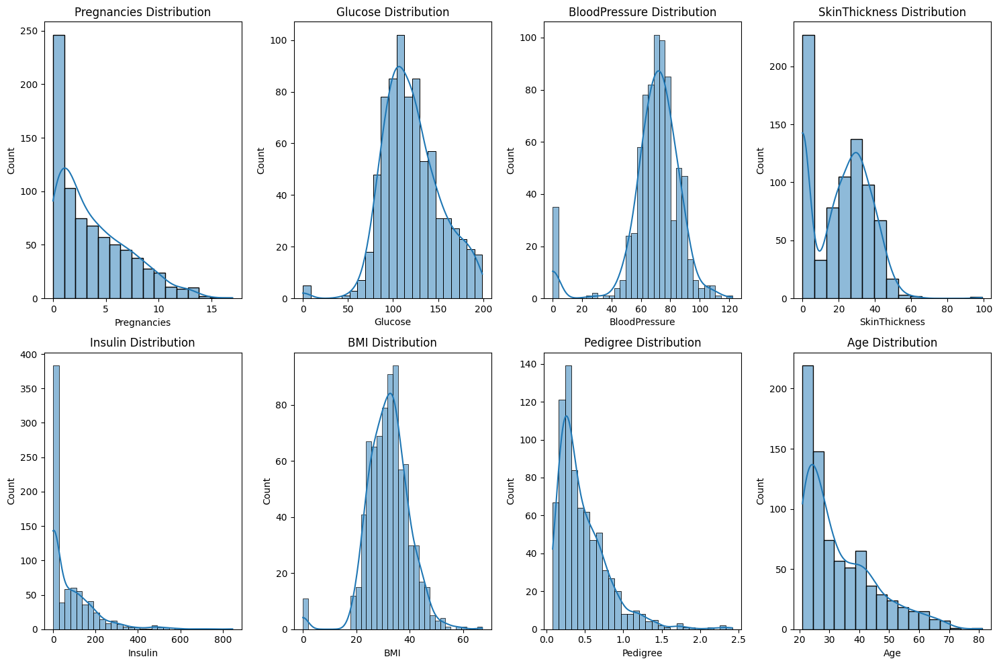

In [208]:
# Create histograms for all numerical features
numerical_features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 
                     'Insulin', 'BMI', 'Pedigree', 'Age']

plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(2, 4, i)
    sns.histplot(data=df, x=feature, kde=True)
    plt.title(f'{feature} Distribution')
plt.tight_layout()
plt.show()


ZERO VALUE ANALYSIS 

In [209]:
# Check for zero values that might represent missing data
for column in numerical_features:
    zero_count = (df[column] == 0).sum()
    total_count = len(df)
    zero_percentage = (zero_count/total_count) * 100
    print(f"{column}: {zero_count} zeros ({zero_percentage:.2f}%)")


Pregnancies: 111 zeros (14.45%)
Glucose: 5 zeros (0.65%)
BloodPressure: 35 zeros (4.56%)
SkinThickness: 227 zeros (29.56%)
Insulin: 374 zeros (48.70%)
BMI: 11 zeros (1.43%)
Pedigree: 0 zeros (0.00%)
Age: 0 zeros (0.00%)


####  DATA CLEAN UP TASKS

## REMOVING ZEROES EXCEPT FOR PREGNANCY COLUMN

In [215]:
import pandas as pd

# Assuming your DataFrame is already loaded as 'df'
# Create a list of columns to process (excluding "Pregnancies")
columns_to_replace_zeros = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

# Function to replace zeros with the median of the respective column
def replace_zeros_with_median(df, columns):
    for col in columns:
        # Replace zeros with the median of the column
        median_value = df[col].median()
        df[col] = df[col].replace(0, median_value)
    return df

# Apply the function
df = replace_zeros_with_median(df, columns_to_replace_zeros)

# Verify that there are no more zeros in the selected columns
print(df[columns_to_replace_zeros].isnull().sum())  # Check for missing values
print(df[columns_to_replace_zeros].describe())  # Get a summary of statistics for these columns



Glucose          0
BloodPressure    0
SkinThickness    0
Insulin          0
BMI              0
dtype: int64
          Glucose  BloodPressure  SkinThickness     Insulin         BMI
count  768.000000     768.000000     768.000000  768.000000  768.000000
mean   121.656250      72.386719      27.334635   94.652344   32.450911
std     30.438286      12.096642       9.229014  105.547598    6.875366
min     44.000000      24.000000       7.000000   14.000000   18.200000
25%     99.750000      64.000000      23.000000   30.500000   27.500000
50%    117.000000      72.000000      23.000000   31.250000   32.000000
75%    140.250000      80.000000      32.000000  127.250000   36.600000
max    199.000000     122.000000      99.000000  846.000000   67.100000


In [216]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72,35.0,30.5,33.6,0.627,50,yes
1,2,1,85.0,66,29.0,30.5,26.6,0.351,31,no
2,3,8,183.0,64,23.0,30.5,23.3,0.672,32,yes
3,4,1,89.0,66,23.0,94.0,28.1,0.167,21,no
4,5,0,137.0,40,35.0,168.0,43.1,2.288,33,yes
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76,48.0,180.0,32.9,0.171,63,no
764,765,2,122.0,70,27.0,30.5,36.8,0.340,27,no
765,766,5,121.0,72,23.0,112.0,26.2,0.245,30,no
766,767,1,126.0,60,23.0,30.5,30.1,0.349,47,yes


In [217]:
# Check for zero values that might represent missing data
for column in numerical_features:
    zero_count = (df[column] == 0).sum()
    total_count = len(df)
    zero_percentage = (zero_count/total_count) * 100
    print(f"{column}: {zero_count} zeros ({zero_percentage:.2f}%)")

Pregnancies: 111 zeros (14.45%)
Glucose: 0 zeros (0.00%)
BloodPressure: 0 zeros (0.00%)
SkinThickness: 0 zeros (0.00%)
Insulin: 0 zeros (0.00%)
BMI: 0 zeros (0.00%)
Pedigree: 0 zeros (0.00%)
Age: 0 zeros (0.00%)


## DETECTION OF OUTLIERS

In [218]:
# List of columns to check for outliers
columns_to_check = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'Pedigree']

# Function to detect outliers using the IQR method
def detect_outliers(column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Return rows where the value is outside the bounds
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

# Detect and print outliers for each column
for column in columns_to_check:
    print(f"Outliers in {column}:")
    outliers = detect_outliers(column)
    print(outliers[[column]])  # Print only the column with outliers
    print()


Outliers in Glucose:
Empty DataFrame
Columns: [Glucose]
Index: []

Outliers in BloodPressure:
     BloodPressure
18              30
43             110
84             108
106            122
125             30
177            110
362            108
549            110
597             24
599             38
658            106
662            106
672            106
691            114

Outliers in SkinThickness:
     SkinThickness
16            47.0
39            47.0
57            60.0
86            54.0
99            51.0
120           56.0
150           50.0
177           46.0
211           54.0
254            7.0
273           50.0
275           52.0
370           48.0
382            8.0
409           49.0
422           46.0
428           46.0
434            8.0
445           63.0
458           48.0
519            7.0
532           52.0
539           49.0
575           47.0
579           99.0
580           46.0
591           50.0
625           47.0
657           48.0
662           46.0
663 

## OUTLIERS CAPPING

In [219]:
# Define the function to cap outliers in a column
def cap_outliers(column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Cap the outliers
    df[column] = df[column].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

# Apply capping to the BloodPressure column
cap_outliers('BloodPressure')

# Display the updated dataframe
print(df[['PatientID', 'BloodPressure']])


     PatientID  BloodPressure
0            1           72.0
1            2           66.0
2            3           64.0
3            4           66.0
4            5           40.0
..         ...            ...
763        764           76.0
764        765           70.0
765        766           72.0
766        767           60.0
767        768           70.0

[768 rows x 2 columns]


SKIN THICKNESS CAPPING

In [220]:
cap_outliers('SkinThickness')
print(df[['PatientID', 'SkinThickness']])



     PatientID  SkinThickness
0            1           35.0
1            2           29.0
2            3           23.0
3            4           23.0
4            5           35.0
..         ...            ...
763        764           45.5
764        765           27.0
765        766           23.0
766        767           23.0
767        768           31.0

[768 rows x 2 columns]


INSULIN CAPPING

In [221]:

cap_outliers('Insulin')
print(df[['PatientID', 'Insulin']])


     PatientID  Insulin
0            1     30.5
1            2     30.5
2            3     30.5
3            4     94.0
4            5    168.0
..         ...      ...
763        764    180.0
764        765     30.5
765        766    112.0
766        767     30.5
767        768     30.5

[768 rows x 2 columns]


BMI CAPPING

In [222]:
cap_outliers('BMI')
print(df[['PatientID', 'BMI']])


     PatientID   BMI
0            1  33.6
1            2  26.6
2            3  23.3
3            4  28.1
4            5  43.1
..         ...   ...
763        764  32.9
764        765  36.8
765        766  26.2
766        767  30.1
767        768  30.4

[768 rows x 2 columns]


In [223]:
df.head(20)

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72.0,35.0,30.500,33.6,0.627,50,yes
1,2,1,85.0,66.0,29.0,30.500,26.6,0.351,31,no
2,3,8,183.0,64.0,23.0,30.500,23.3,0.672,32,yes
3,4,1,89.0,66.0,23.0,94.000,28.1,0.167,21,no
4,5,0,137.0,40.0,35.0,168.000,43.1,2.288,33,yes
5,6,5,116.0,74.0,23.0,30.500,25.6,0.201,30,no
6,7,3,78.0,50.0,32.0,88.000,31.0,0.248,26,yes
7,8,10,115.0,72.0,23.0,30.500,35.3,0.134,29,no
8,9,2,197.0,70.0,45.0,272.375,30.5,0.158,53,yes
9,10,8,125.0,96.0,23.0,30.500,32.0,0.232,54,yes


## ENCODING DIABETES PRED COLUMN

In [224]:
from sklearn.preprocessing import LabelEncoder

# Label Encoding for 'DiabetesPred' column
label_encoder = LabelEncoder()
df['DiabetesPred'] = label_encoder.fit_transform(df['DiabetesPred'])

# Check the result
print(df[['DiabetesPred']].head())


   DiabetesPred
0             1
1             0
2             1
3             0
4             1


In [226]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72.0,35.0,30.5,33.6,0.627,50,1
1,2,1,85.0,66.0,29.0,30.5,26.6,0.351,31,0
2,3,8,183.0,64.0,23.0,30.5,23.3,0.672,32,1
3,4,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,5,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76.0,45.5,180.0,32.9,0.171,63,0
764,765,2,122.0,70.0,27.0,30.5,36.8,0.340,27,0
765,766,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,767,1,126.0,60.0,23.0,30.5,30.1,0.349,47,1


## CORRELATION MATRIX 

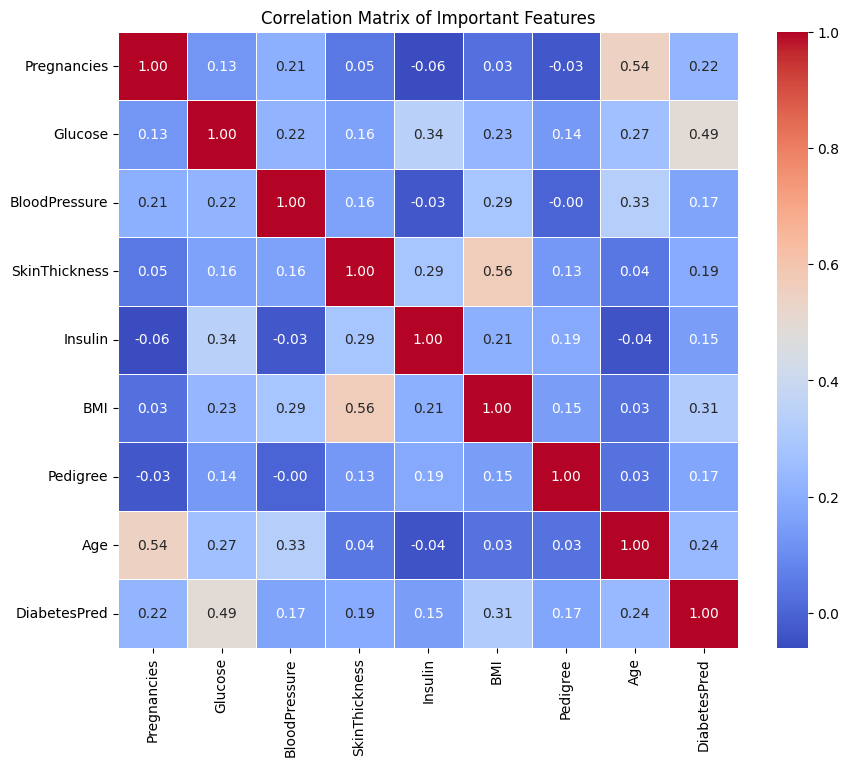


Highly correlated feature pairs (|correlation| > 0.70):

Features poorly correlated with 'DiabetesPred' (|correlation| < 0.10):
[]

Final features to use in model building:
['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'Pedigree', 'Age']


In [227]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Exclude unnecessary columns (e.g., 'PatientID') from the correlation matrix
# Select columns excluding irrelevant ones
important_features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'Pedigree', 'Age', 'DiabetesPred']
df_selected = df[important_features]

# Calculate the correlation matrix
correlation_matrix = df_selected.corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
plt.title("Correlation Matrix of Important Features")
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.show()

# Define thresholds for high and low correlations
high_corr_threshold = 0.7  # Strong correlation
low_corr_threshold = 0.1  # Weak correlation

# Identify highly correlated features
highly_correlated = [
    (col1, col2, correlation_matrix.loc[col1, col2])
    for i, col1 in enumerate(correlation_matrix.columns)
    for col2 in correlation_matrix.columns[i + 1:]
    if abs(correlation_matrix.loc[col1, col2]) > high_corr_threshold
]

# Identify poorly correlated features with the target column (e.g., "DiabetesPred")
poorly_correlated = correlation_matrix["DiabetesPred"][
    (correlation_matrix["DiabetesPred"].abs() < low_corr_threshold)
].index.tolist()

# Print highly correlated feature pairs
print("\nHighly correlated feature pairs (|correlation| > {:.2f}):".format(high_corr_threshold))
for col1, col2, corr_value in highly_correlated:
    print(f"{col1} and {col2}: correlation = {corr_value:.2f}")

# Print poorly correlated features with the target
print("\nFeatures poorly correlated with 'DiabetesPred' (|correlation| < {:.2f}):".format(low_corr_threshold))
print(poorly_correlated)

# Drop redundant or irrelevant features based on correlations
# Decide which columns to drop (for example, based on domain knowledge and correlation analysis)
features_to_drop = set([col for col1, col2, _ in highly_correlated for col in [col2]])
features_to_drop.update(poorly_correlated)

# Keep only the relevant features
final_features = [col for col in important_features if col not in features_to_drop and col != "DiabetesPred"]

# Print final features to use in model building
print("\nFinal features to use in model building:")
print(final_features)

# Create a new DataFrame with selected features
df_final = df[final_features + ["DiabetesPred"]]


EXPLANATION FOR THE ABOVE OUTPUT 

Explanation of the Output:
Highly Correlated Feature Pairs (|correlation| > 0.70):

No feature pairs have a correlation greater than 0.70. This indicates that none of the features in your dataset are strongly correlated with each other.
This is a good sign because it reduces the risk of multicollinearity, where strongly correlated features might skew model coefficients and reduce interpretability.
Features Poorly Correlated with 'DiabetesPred' (|correlation| < 0.10):

The feature PatientID has a correlation below the threshold (|0.10|) with the target variable DiabetesPred.
Since PatientID is an identifier and not a meaningful predictor of diabetes, it is expected to have low correlation with the target. Therefore, it is correct to exclude it from the final model.
Final Features to Use in Model Building:

The selected features are: ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'Pedigree', 'Age'].
These features are relevant for predicting diabetes and have been retained because:
They are not highly correlated with each other.
They have reasonable correlation with the target variable (DiabetesPred).

In [228]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72.0,35.0,30.5,33.6,0.627,50,1
1,2,1,85.0,66.0,29.0,30.5,26.6,0.351,31,0
2,3,8,183.0,64.0,23.0,30.5,23.3,0.672,32,1
3,4,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,5,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76.0,45.5,180.0,32.9,0.171,63,0
764,765,2,122.0,70.0,27.0,30.5,36.8,0.340,27,0
765,766,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,767,1,126.0,60.0,23.0,30.5,30.1,0.349,47,1


In [229]:
print(df.isnull().sum())


PatientID        0
Pregnancies      0
Glucose          0
BloodPressure    0
SkinThickness    0
Insulin          0
BMI              0
Pedigree         0
Age              0
DiabetesPred     0
dtype: int64


## STRTIFICATION AND TRAIN/TEST SPLIT DONE

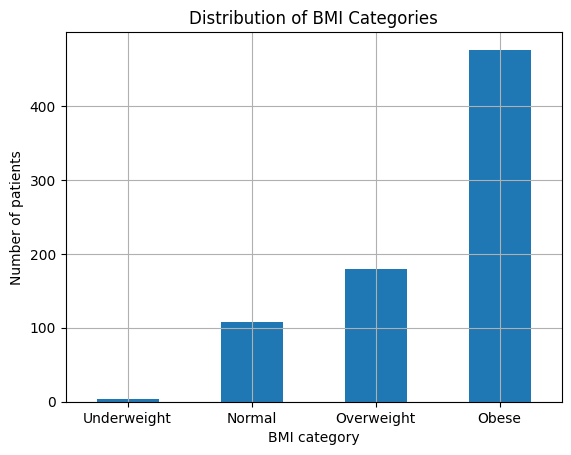

BMI category distribution in training set:
BMI_cat
Obese          0.620521
Overweight     0.234528
Normal         0.140065
Underweight    0.004886
Name: count, dtype: float64

BMI category distribution in testing set:
BMI_cat
Obese          0.616883
Overweight     0.233766
Normal         0.142857
Underweight    0.006494
Name: count, dtype: float64


In [ ]:
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import train_test_split
# import matplotlib.pyplot as plt

# # Assuming the dataset is already loaded as `df`

# # Create a category column based on BMI (example feature)
# df["BMI_cat"] = pd.cut(df["BMI"], bins=[0, 18.5, 25, 30, np.inf], labels=["Underweight", "Normal", "Overweight", "Obese"])

# # Visualize the distribution of BMI categories
# df["BMI_cat"].value_counts().sort_index().plot.bar(rot=0, grid=True)
# plt.xlabel("BMI category")
# plt.ylabel("Number of patients")
# plt.title("Distribution of BMI Categories")
# plt.show()

# # Perform train/test split with stratification based on BMI category
# strat_train_set, strat_test_set = train_test_split(df, test_size=0.2, stratify=df["BMI_cat"], random_state=42)

# # Check the distribution in training and testing sets
# print("BMI category distribution in training set:")
# print(strat_train_set["BMI_cat"].value_counts() / len(strat_train_set))

# print("\nBMI category distribution in testing set:")
# print(strat_test_set["BMI_cat"].value_counts() / len(strat_test_set))

# # Drop the BMI_cat column after splitting
# for set_ in (strat_train_set, strat_test_set):
#     set_.drop("BMI_cat", axis=1, inplace=True)

# # Use the training set for further analysis
# df = strat_train_set.copy()


## Y_DATA PROFILING

In [150]:
import pandas as pd
from ydata_profiling import ProfileReport

# Load your dataset (assuming your dataset is stored in 'df')
# Replace 'df' with your actual DataFrame

# Generate a profile report
profile = ProfileReport(df, title="Diabetes Dataset Profile Report", explorative=True)

# Save the report to an HTML file
profile.to_file("diabetes_dataset_profile.html")

# Optionally display the report in a Jupyter Notebook (if you're using one)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## EXPERIMENT 1 

In [230]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,6,148.0,72.0,35.0,30.5,33.6,0.627,50,1
1,2,1,85.0,66.0,29.0,30.5,26.6,0.351,31,0
2,3,8,183.0,64.0,23.0,30.5,23.3,0.672,32,1
3,4,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,5,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101.0,76.0,45.5,180.0,32.9,0.171,63,0
764,765,2,122.0,70.0,27.0,30.5,36.8,0.340,27,0
765,766,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,767,1,126.0,60.0,23.0,30.5,30.1,0.349,47,1


## STANDARDIZATION

In [231]:
from sklearn.preprocessing import StandardScaler
# Select the numerical features (excluding PatientID and DiabetesPred)
numerical_features = df.drop(columns=['PatientID', 'DiabetesPred'])

# Initialize StandardScaler
scaler = StandardScaler()

# Apply StandardScaler to the numerical features
df[numerical_features.columns] = scaler.fit_transform(numerical_features)

# Display the first few rows of the scaled dataset
print(df.head())



   PatientID  Pregnancies   Glucose  BloodPressure  SkinThickness   Insulin  \
0          1     0.639947  0.866045      -0.030632       0.933847 -0.729820   
1          2    -0.844885 -1.205066      -0.543914       0.223108 -0.729820   
2          3     1.233880  2.016662      -0.715008      -0.487630 -0.729820   
3          4    -0.844885 -1.073567      -0.543914      -0.487630  0.103101   
4          5    -1.141852  0.504422      -2.768136       0.933847  1.073750   

        BMI  Pedigree       Age  DiabetesPred  
0  0.181733  0.468492  1.425995             1  
1 -0.868800 -0.365061 -0.190672             0  
2 -1.364051  0.604397 -0.105584             1  
3 -0.643686 -0.920763 -1.041549             0  
4  1.607456  5.484909 -0.020496             1  


### CHECKING SKEWNESS OF FEATURES

In [232]:
import pandas as pd

# Select only numerical features (excluding non-numerical columns like PatientID, DiabetesPred)
numerical_features = df.drop(columns=['PatientID', 'DiabetesPred'])

# Calculate skewness for each numerical feature
skewness = numerical_features.skew()

# Display the skewness values
print("Skewness of Numerical Features:")
print(skewness)

# Optional: Highlight highly skewed features (absolute skewness > 1)
highly_skewed = skewness[skewness.abs() > 1]
print("\nHighly Skewed Features (|skewness| > 1):")
print(highly_skewed)


Skewness of Numerical Features:
Pregnancies      0.901674
Glucose          0.535587
BloodPressure    0.105665
SkinThickness    0.497665
Insulin          1.239997
BMI              0.351793
Pedigree         1.919911
Age              1.129597
dtype: float64

Highly Skewed Features (|skewness| > 1):
Insulin     1.239997
Pedigree    1.919911
Age         1.129597
dtype: float64


## LOG TRANSFORMATIOM

In [70]:
import numpy as np

# Features to transform
features_to_transform = ['Insulin', 'Pedigree', 'Age']

# Check if there are any zero or negative values
for feature in features_to_transform:
    if (df[feature] <= 0).any():
        print(f"Adding 1 to {feature} to handle non-positive values.")
        df[feature] += 1

# Apply log transformation
for feature in features_to_transform:
    df[feature] = np.log(df[feature])

# Check the new skewness after transformation
new_skewness = df[features_to_transform].skew()
print("\nSkewness after log transformation:")
print(new_skewness)


Adding 1 to Insulin to handle non-positive values.
Adding 1 to Pedigree to handle non-positive values.
Adding 1 to Age to handle non-positive values.

Skewness after log transformation:
Insulin     0.480791
Pedigree   -1.050271
Age        -0.774167
dtype: float64


c:\Users\chanc\Desktop\ZIA FINAL PROJECT\EASF\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [71]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
231,232,0.652466,0.432051,0.652533,1.173199,1.223971,2.073569,-1.267322,0.744252,1
334,335,-0.861571,-0.860701,-1.036926,-1.079544,-0.469085,-1.280940,-1.052166,-3.300256,0
742,743,-0.861571,-0.396636,-1.205872,-1.079544,0.319461,-0.588978,-1.499659,-3.300256,0
460,461,1.560889,-0.032014,-0.023251,-0.605282,-0.511351,-1.747261,0.589172,0.822946,0
118,119,0.046851,-0.794406,-1.036926,-0.486717,-1.310866,-0.634106,-0.092711,-3.300256,0
...,...,...,...,...,...,...,...,...,...,...
361,362,0.349659,1.227590,-0.192197,-0.486717,-1.310866,-0.393424,-1.680205,1.272480,0
591,592,-0.558764,-0.297194,0.483587,2.181004,0.522991,1.050670,-2.430257,-1.564434,0
350,351,0.046851,-0.960143,0.652533,-0.486717,-1.310866,1.471864,-1.278294,-0.446228,0
512,513,1.560889,-0.993291,-0.361142,-0.486717,-1.310866,-1.235812,-1.802854,1.143860,0


## LOGISTIC REGRESSION WITH TUNING

In [233]:
df

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,0.639947,0.866045,-0.030632,0.933847,-0.729820,0.181733,0.468492,1.425995,1
1,2,-0.844885,-1.205066,-0.543914,0.223108,-0.729820,-0.868800,-0.365061,-0.190672,0
2,3,1.233880,2.016662,-0.715008,-0.487630,-0.729820,-1.364051,0.604397,-0.105584,1
3,4,-0.844885,-1.073567,-0.543914,-0.487630,0.103101,-0.643686,-0.920763,-1.041549,0
4,5,-1.141852,0.504422,-2.768136,0.933847,1.073750,1.607456,5.484909,-0.020496,1
...,...,...,...,...,...,...,...,...,...,...
763,764,1.827813,-0.679069,0.311556,2.177640,1.231152,0.076680,-0.908682,2.532136,0
764,765,-0.547919,0.011301,-0.201726,-0.013804,-0.729820,0.661976,-0.398282,-0.531023,0
765,766,0.342981,-0.021574,-0.030632,-0.487630,0.339205,-0.928831,-0.685193,-0.275760,0
766,767,-0.844885,0.142800,-1.057196,-0.487630,-0.729820,-0.343534,-0.371101,1.170732,1


In [234]:
df.isnull()

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
763,False,False,False,False,False,False,False,False,False,False
764,False,False,False,False,False,False,False,False,False,False
765,False,False,False,False,False,False,False,False,False,False
766,False,False,False,False,False,False,False,False,False,False


In [94]:
# End the MLflow run
mlflow.end_run()

🏃 View run Experiment 1 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/2b9bd64119b045d0a6ab75190082343e
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Hyperparameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Best F1-Score on Training Data (CV): 0.6564786324786325
Mean CV F1-Score: 0.6052
Standard Deviation of CV F1-Score: 0.1357
F1-Score on Training Data: 0.6718346253229974

Metrics on Training Data:
Accuracy: 0.7932
Precision: 0.7514
Recall: 0.6075
F1-Score: 0.6718

Training Confusion Matrix:
[[357  43]
 [ 84 130]]
True Positives: 357, False Negatives: 43, False Positives: 84, True Negatives: 130

Metrics on Test Data:
Accuracy: 0.7013
Precision: 0.5833
Recall: 0.5185
F1-Score: 0.5490

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.75      0.80      0.78       100
           1       0.58      0.52      0.55        54

    accuracy                           0.70       154
   macro avg       0.67      0.66      0.66       154
weighted avg       0.69      0.70      0.70       154


Confusion Matr

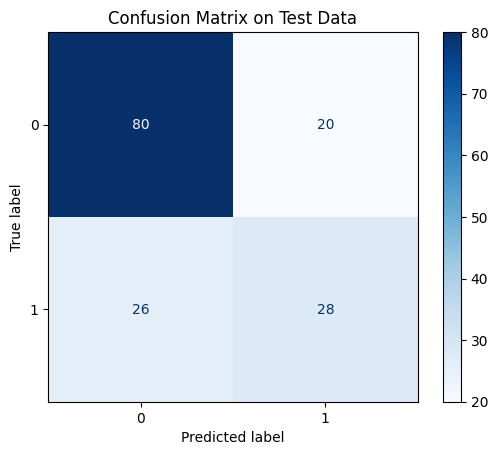

In [235]:
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.impute import SimpleImputer

# Start MLflow experiment
mlflow.start_run()




# Separate features (X) and target variable (y)
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Define Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter=500)

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Impute missing values in the feature set
imputer = SimpleImputer(strategy="mean")  # Use mean to replace missing values
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Define hyperparameter grid
param_grid = {
    "C": [0.01, 0.1, 1, 10, 100],  # Regularization strengths
    "penalty": ["l1", "l2"],       # Regularization types
    "solver": ["liblinear"],       # Solver supporting l1 and l2 penalties
}

# Define GridSearchCV with F1-score as the metric
grid_search = GridSearchCV(
    estimator=log_reg,
    param_grid=param_grid,
    scoring="f1",
    cv=cv,
    n_jobs=-1,
    verbose=2
)

# Perform grid search
grid_search.fit(X_train_imputed, y_train)

# Display best hyperparameters and best F1-score
print("Best Hyperparameters:", grid_search.best_params_)
print("Best F1-Score on Training Data (CV):", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Results—mean/std of CV results
cv_results = grid_search.cv_results_
mean_cv_score = np.mean(cv_results['mean_test_score'])
std_cv_score = np.std(cv_results['mean_test_score'])
print(f"Mean CV F1-Score: {mean_cv_score:.4f}")
print(f"Standard Deviation of CV F1-Score: {std_cv_score:.4f}")


# Predict on training data
y_train_pred = best_model.predict(X_train_imputed)

# Compute F1-score on training data
f1_train = f1_score(y_train, y_train_pred)
print("F1-Score on Training Data:", f1_train)

# Compute accuracy, precision, and recall on training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)

print("\nMetrics on Training Data:")
print(f"Accuracy: {accuracy_train:.4f}")
print(f"Precision: {precision_train:.4f}")
print(f"Recall: {recall_train:.4f}")
print(f"F1-Score: {f1_train:.4f}")

# Confusion matrix for training data
cm_train = confusion_matrix(y_train, y_train_pred)
tp, fn, fp, tn = cm_train.ravel()
print(f"\nTraining Confusion Matrix:\n{cm_train}")
print(f"True Positives: {tp}, False Negatives: {fn}, False Positives: {fp}, True Negatives: {tn}")

# Predict on test data
y_test_pred = best_model.predict(X_test_imputed)



# Accuracy metrics on test data
accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Log test metrics to MLflow
mlflow.log_metric("accuracy", accuracy)
mlflow.log_metric("precision", precision)
mlflow.log_metric("recall", recall)
mlflow.log_metric("f1_score", f1)


# Print test metrics
print("\nMetrics on Test Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# Classification report on test data
print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred))

# Confusion matrix on test data
cm_test = confusion_matrix(y_test, y_test_pred)
print("\nConfusion Matrix on Test Data:")
print(cm_test)



# Plot confusion matrix for test data
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=best_model.classes_)
disp.plot(cmap="Blues")
disp.ax_.set_title("Confusion Matrix on Test Data")


mlflow.log_param('Models', 'LogisticRegression')

# Log classification report as artifact
with open("classification_report_test.txt", "w") as f:
    f.write(classification_report(y_test, y_test_pred))
mlflow.log_artifact("classification_report_test.txt")

# Log confusion matrix plot as artifact
disp.figure_.savefig("confusion_matrix_test.png")
mlflow.log_artifact("confusion_matrix_test.png")

# End the MLflow run
mlflow.end_run()


In [177]:
import pandas as pd

# Ensure the original column names are retained in the new DataFrame
columns = X.columns  # Assuming X has the original column names

# Create a DataFrame from the imputed test dataset
X_test_df = pd.DataFrame(X_test_imputed, columns=columns)

# Add the actual target variable from the test set
X_test_df['Actual'] = y_test.values

# Predict the outcome for each row using the trained model
X_test_df['Predicted'] = best_model.predict(X_test_imputed)

# Display the new DataFrame with predictions
print(X_test_df.head())

# Save the DataFrame to a CSV file for review
X_test_df.to_csv("predictions_with_features.csv", index=False)


   Pregnancies   Glucose  BloodPressure  SkinThickness   Insulin       BMI  \
0    -1.164379 -0.131456      -0.530088       0.461806  0.836567 -0.242997   
1    -0.558764  0.266313       0.990425      -0.486717 -1.310866 -0.664191   
2    -1.164379  0.233166      -0.361142      -0.960978  0.790667 -0.288125   
3     0.955274 -0.230899       0.314641      -1.198109  0.261376 -1.295982   
4     0.955274 -1.324765       0.483587       1.528895 -0.700929  2.148782   

   Pedigree       Age  Actual  Predicted  
0  0.063054 -3.300256       0          0  
1 -0.860568 -0.759917       0          0  
2  1.341357 -1.219517       1          0  
3 -0.018036 -0.207799       0          0  
4 -1.043405  0.565428       0          0  


In [115]:
mlflow.end_run()

### TESTING ON THE ABOVE 

In [86]:
def predict_diabetes(user_input, model, imputer):
    """
    Predict whether a patient has diabetes or not based on user input.
    
    Parameters:
    - user_input (dict): Dictionary containing user inputs for all features.
    - model: Trained logistic regression model.
    - imputer: Trained imputer to handle missing values.
    
    Returns:
    - str: Prediction result ("Diabetes" or "No Diabetes").
    """
    # Convert user input dictionary to a DataFrame
    input_df = pd.DataFrame([user_input])
    
    # Impute missing values
    input_imputed = imputer.transform(input_df)
    
    # Predict using the trained model
    prediction = model.predict(input_imputed)
    
    # Return the result
    return "Diabetes" if prediction[0] == 1 else "No Diabetes"

# Example usage:
# Define the user input (keys should match feature names in the dataset)
user_input = {
    "Pregnancies": 3,
    "Glucose": 120,
    "BloodPressure": 70,
    "SkinThickness": 20,
    "Insulin": 85,
    "BMI": 28.5,
    "Pedigree": 0.5,
    "Age": 35
}

# Call the prediction function
result = predict_diabetes(user_input, best_model, imputer)

print(f"Prediction for the input patient data: {result}")


Prediction for the input patient data: Diabetes


## RIDGE CLASSIFIER

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Best Hyperparameters: {'alpha': 0.01}
Best F1-Score on Training Data (CV): 0.5542265669925245

Metrics on Test Data:
Accuracy: 0.8130
F1-Score: 0.7229

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.84      0.88      0.86        80
           1       0.75      0.70      0.72        43

    accuracy                           0.81       123
   macro avg       0.80      0.79      0.79       123
weighted avg       0.81      0.81      0.81       123


Confusion Matrix on Test Data:
[[70 10]
 [13 30]]
🏃 View run efficient-perch-533 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/d09fb36765174507929ab7220494e896
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


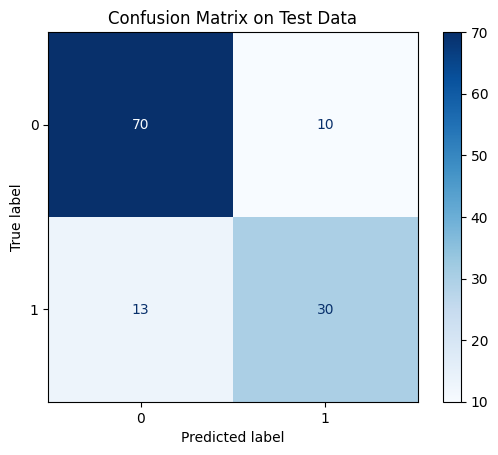

In [129]:
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.impute import SimpleImputer

mlflow.start_run()

# Separate features (X) and target variable (y)
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Define Ridge Classifier
ridge_classifier = RidgeClassifier(random_state=42)

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Impute missing values in the feature set
imputer = SimpleImputer(strategy="mean")  # Use mean to replace missing values
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Define hyperparameter grid for Ridge Classifier
param_grid = {
    "alpha": [0.01, 0.1, 1, 10, 100]  # Regularization strength
}

# Define GridSearchCV with F1-score as the metric
grid_search = GridSearchCV(
    estimator=ridge_classifier,
    param_grid=param_grid,
    scoring="f1",
    cv=cv,
    n_jobs=-1,
    verbose=2
)

# Perform grid search
grid_search.fit(X_train_imputed, y_train)

# Display best hyperparameters and best F1-score
print("Best Hyperparameters:", grid_search.best_params_)
print("Best F1-Score on Training Data (CV):", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Predict on test data
y_test_pred = best_model.predict(X_test_imputed)

# Accuracy metrics on test data
accuracy = accuracy_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)

# Log test metrics to MLflow
mlflow.log_metric("accuracy", accuracy)
mlflow.log_metric("precision", precision)
mlflow.log_metric("recall", recall)
mlflow.log_metric("f1_score", f1)


# Print test metrics
print("\nMetrics on Test Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1-Score: {f1:.4f}")



# Classification report on test data
print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred))

# Confusion matrix on test data
cm_test = confusion_matrix(y_test, y_test_pred)
print("\nConfusion Matrix on Test Data:")
print(cm_test)

# Plot confusion matrix for test data
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=best_model.classes_)
disp.plot(cmap="Blues")
disp.ax_.set_title("Confusion Matrix on Test Data")


mlflow.log_param('Models', 'RidgeClassifier')



# Log confusion matrix as artifact
mlflow.log_param("confusion_matrix", cm_test .tolist())


# Log classification report as artifact
with open("classification_report_test.txt", "w") as f:
    f.write(classification_report(y_test, y_test_pred))
mlflow.log_artifact("classification_report_test.txt")

# Log confusion matrix plot as artifact
disp.figure_.savefig("confusion_matrix_test.png")
mlflow.log_artifact("confusion_matrix_test.png")

# End the MLflow run
mlflow.end_run()


In [125]:
mlflow.end_run()


## RANDOM FOREST

Fitting 3 folds for each of 288 candidates, totalling 864 fits
Mean CV F1-Score: 0.5850
Standard Deviation of CV F1-Score: 0.0140
F1-Score on Training Data: 0.9825581395348837

Metrics on Training Data:
Accuracy: 0.9878
Precision: 0.9883
Recall: 0.9769
F1-Score: 0.9826

Training Confusion Matrix:
[[316   2]
 [  4 169]]
True Positives: 316, False Negatives: 2, False Positives: 4, True Negatives: 169

Metrics on Test Data:
Accuracy: 0.7561
Precision: 0.6512
Recall: 0.6512
F1-Score: 0.6512

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.81      0.81      0.81        80
           1       0.65      0.65      0.65        43

    accuracy                           0.76       123
   macro avg       0.73      0.73      0.73       123
weighted avg       0.76      0.76      0.76       123


Confusion Matrix on Test Data:
[[65 15]
 [15 28]]
🏃 View run fun-hound-128 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/

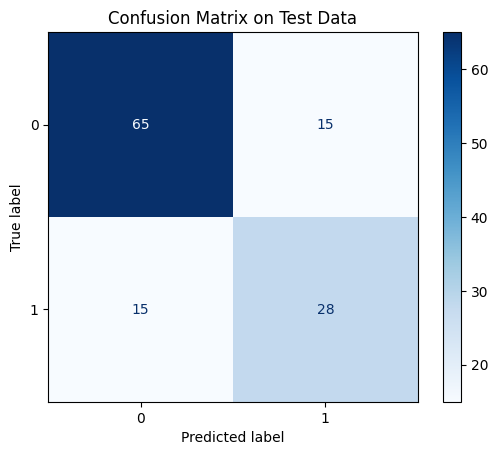

In [126]:
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.impute import SimpleImputer

# Start MLflow experiment
mlflow.start_run()

# Separate features (X) and target variable (y)
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Define Random Forest Classifier
rf_clf = RandomForestClassifier(random_state=42)

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Impute missing values in the feature set
imputer = SimpleImputer(strategy="mean")  # Use mean to replace missing values
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Define hyperparameter grid for Random Forest Classifier
param_grid = {
    "n_estimators": [50, 100, 150, 200],  # Number of trees
    "max_depth": [None, 10, 20, 30],  # Maximum depth of trees
    "min_samples_split": [2, 5, 10],  # Minimum samples required to split a node
    "min_samples_leaf": [1, 2, 4],  # Minimum samples required at leaf node
    "bootstrap": [True, False],  # Whether to use bootstrap sampling
}

# Define GridSearchCV with F1-score as the metric
grid_search = GridSearchCV(
    estimator=rf_clf,
    param_grid=param_grid,
    scoring="f1",
    cv=cv,
    n_jobs=-1,
    verbose=2
)

# Perform grid search
grid_search.fit(X_train_imputed, y_train)


# Get the best model
best_model = grid_search.best_estimator_

# Results—mean/std of CV results
cv_results = grid_search.cv_results_
mean_cv_score = np.mean(cv_results['mean_test_score'])
std_cv_score = np.std(cv_results['mean_test_score'])
print(f"Mean CV F1-Score: {mean_cv_score:.4f}")
print(f"Standard Deviation of CV F1-Score: {std_cv_score:.4f}")

# Log CV results to MLflow
#mlflow.log_metric("mean_cv_f1_score", mean_cv_score)
#mlflow.log_metric("std_cv_f1_score", std_cv_score)

# Predict on training data
y_train_pred = best_model.predict(X_train_imputed)

# Compute F1-score on training data
f1_train = f1_score(y_train, y_train_pred)
print("F1-Score on Training Data:", f1_train)



# Compute accuracy, precision, and recall on training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)

print("\nMetrics on Training Data:")
print(f"Accuracy: {accuracy_train:.4f}")
print(f"Precision: {precision_train:.4f}")
print(f"Recall: {recall_train:.4f}")
print(f"F1-Score: {f1_train:.4f}")


# Confusion matrix for training data
cm_train = confusion_matrix(y_train, y_train_pred)
tp, fn, fp, tn = cm_train.ravel()
print(f"\nTraining Confusion Matrix:\n{cm_train}")
print(f"True Positives: {tp}, False Negatives: {fn}, False Positives: {fp}, True Negatives: {tn}")



# Predict on test data
y_test_pred = best_model.predict(X_test_imputed)

# Accuracy metrics on test data
accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Log test metrics to MLflow
mlflow.log_metric("accuracy", accuracy)
mlflow.log_metric("precision", precision)
mlflow.log_metric("recall", recall)
mlflow.log_metric("f1_score", f1)

# Print test metrics
print("\nMetrics on Test Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# Classification report on test data
print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred))

# Log classification report as artifact
with open("classification_report_test.txt", "w") as f:
    f.write(classification_report(y_test, y_test_pred))
mlflow.log_artifact("classification_report_test.txt")

# Confusion matrix on test data
cm_test = confusion_matrix(y_test, y_test_pred)
print("\nConfusion Matrix on Test Data:")
print(cm_test)



# Plot confusion matrix for test data
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=best_model.classes_)
disp.plot(cmap="Blues")
disp.ax_.set_title("Confusion Matrix on Test Data")

mlflow.log_param('Models', 'RandomForestClassifier')

# Log confusion matrix plot as artifact
disp.figure_.savefig("confusion_matrix_test.png")
mlflow.log_artifact("confusion_matrix_test.png")

# End the MLflow run
mlflow.end_run()


## XGBOOST


Metrics on Test Data:
Accuracy: 0.6992
Precision: 0.5652
Recall: 0.6047
F1-Score: 0.5843

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.78      0.75      0.76        80
           1       0.57      0.60      0.58        43

    accuracy                           0.70       123
   macro avg       0.67      0.68      0.67       123
weighted avg       0.70      0.70      0.70       123


Confusion Matrix on Test Data:
[[60 20]
 [17 26]]
🏃 View run bright-tern-646 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/ca6ef861a91f4486b59b860aa0f2de9c
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


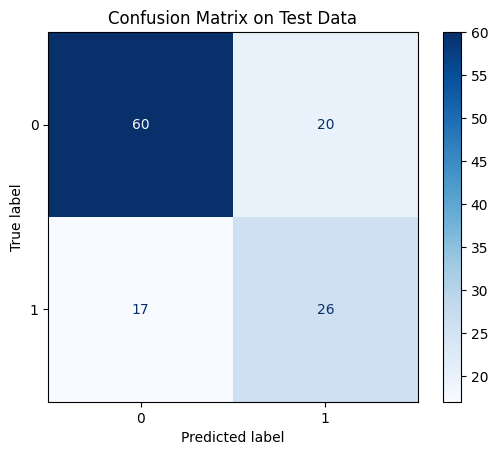

In [132]:
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.impute import SimpleImputer

# Start MLflow experiment
mlflow.start_run()

# Separate features (X) and target variable (y)
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Define XGBoost classifier
xgb_clf = XGBClassifier(random_state=42)

# Impute missing values in the feature set
imputer = SimpleImputer(strategy="mean")  # Use mean to replace missing values
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Fit the XGBoost model
xgb_clf.fit(X_train_imputed, y_train)

# Predict on test data
y_test_pred = xgb_clf.predict(X_test_imputed)

# Accuracy metrics on test data
accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Log metrics to MLflow
mlflow.log_metric("accuracy", accuracy)
mlflow.log_metric("precision", precision)
mlflow.log_metric("recall", recall)
mlflow.log_metric("f1", f1)

# Print test metrics
print("\nMetrics on Test Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# Classification report on test data
print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred))

# Log classification report as artifact
with open("classification_report_test.txt", "w") as f:
    f.write(classification_report(y_test, y_test_pred))
mlflow.log_artifact("classification_report_test.txt")

# Confusion matrix on test data
cm_test = confusion_matrix(y_test, y_test_pred)
print("\nConfusion Matrix on Test Data:")
print(cm_test)

mlflow.log_param('Models', 'XGBClassifier')

# Plot confusion matrix for test data
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=xgb_clf.classes_)
disp.plot(cmap="Blues")
disp.ax_.set_title("Confusion Matrix on Test Data")

# Log confusion matrix plot as artifact
disp.figure_.savefig("confusion_matrix_test.png")
mlflow.log_artifact("confusion_matrix_test.png")

# End the MLflow run
mlflow.end_run()


## EXPERIMENT 3

In [133]:
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# Start MLflow experiment
mlflow.start_run()

# Create a copy of the original dataset for feature engineering
df_final = df.copy()

# Feature Engineering

# 1. Handle Missing Values for the Numerical Features
numerical_features = df_final.select_dtypes(include=["float64", "int64"]).columns.tolist()
numerical_features.remove('PatientID')  # Remove 'PatientID' as it's an ID and not a feature
numerical_features.remove('DiabetesPred')  # Remove target variable

# Impute missing values in numerical columns with the mean
imputer = SimpleImputer(strategy="median")
df_final[numerical_features] = imputer.fit_transform(df_final[numerical_features])

# 2. Feature Scaling (Standardization of Numerical Features)
scaler = StandardScaler()
df_final[numerical_features] = scaler.fit_transform(df_final[numerical_features])

# 3. Create New Feature (Interaction Terms or Combinations)
# Example: Creating a feature by combining two numerical columns (if logical based on domain knowledge)
# For example, let's create an interaction term between 'Glucose' and 'BMI'
df_final['Glucose_BMI_Interaction'] = df_final['Glucose'] * df_final['BMI']

# Log the engineered dataframe to MLflow as an artifact
df_final.to_csv("df_final.csv", index=False)
mlflow.log_artifact("df_final.csv")

# Train-Test split
X = df_final.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df_final["DiabetesPred"]  # Target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Log the number of features after feature engineering
mlflow.log_param("num_features", X_train.shape[1])

# Log the first 5 rows of the final dataframe (for review purposes)
X_train.head().to_csv("X_train_head.csv")
mlflow.log_artifact("X_train_head.csv")

# End the MLflow run
mlflow.end_run()

print("Feature engineering and logging completed.")


🏃 View run burly-grub-189 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/7e0c1e49fee44482965dc75cf7498d88
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0
Feature engineering and logging completed.


## EXPERIMENT 4

🏃 View run gregarious-stag-152 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/84073cc959394edc862612019fe26025
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


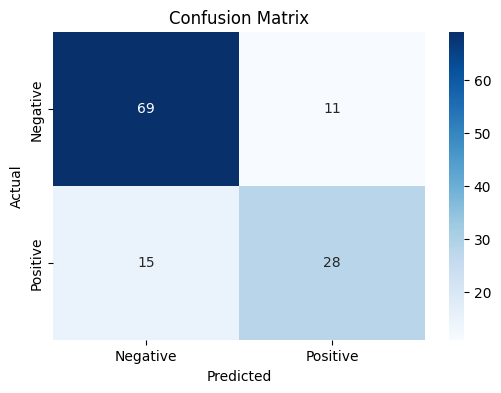

In [137]:
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Start MLflow experiment
mlflow.start_run()

# Load the dataset and perform feature engineering from previous experiment
df_final = df.copy()

# 1. Handle Missing Values for the Numerical Features (if not already done)
numerical_features = df_final.select_dtypes(include=["float64", "int64"]).columns.tolist()
numerical_features.remove('PatientID')  # Remove 'PatientID' as it's an ID and not a feature
numerical_features.remove('DiabetesPred')  # Remove target variable

# Impute missing values in numerical columns with the mean
imputer = SimpleImputer(strategy="mean")
df_final[numerical_features] = imputer.fit_transform(df_final[numerical_features])

# 2. Feature Scaling (Standardization of Numerical Features)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_final[numerical_features] = scaler.fit_transform(df_final[numerical_features])

# Define X (features) and y (target)
X = df_final.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df_final["DiabetesPred"]  # Target variable

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Log the number of features before feature selection
mlflow.log_param("initial_num_features", X_train.shape[1])

# ---------------------------------------------
# 1. Feature Selection Using Correlation Threshold
# ---------------------------------------------
# Calculate the correlation matrix
corr_matrix = X_train.corr().abs()

# Set a threshold for correlation
corr_threshold = 0.9
to_drop = set()

# Check for high correlations and store column names to drop
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if corr_matrix.iloc[i, j] > corr_threshold:
            colname = corr_matrix.columns[i]
            to_drop.add(colname)

# Drop correlated columns
X_train_corr = X_train.drop(columns=to_drop)
X_test_corr = X_test.drop(columns=to_drop)

# Log the number of features after correlation thresholding
mlflow.log_param("num_features_after_corr_threshold", X_train_corr.shape[1])

# ----------------------------------------
# 2. Feature Selection Using Feature Importance
# ----------------------------------------
# Train a Random Forest model to compute feature importance
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_corr, y_train)

# Get feature importance
feature_importances = rf.feature_importances_

# Set a threshold for feature importance
importance_threshold = 0.05
important_features = [X_train_corr.columns[i] for i in range(len(feature_importances)) if feature_importances[i] > importance_threshold]

# Select important features
X_train_important = X_train_corr[important_features]
X_test_important = X_test_corr[important_features]

# Log the number of features after feature importance selection
mlflow.log_param("num_features_after_importance", X_train_important.shape[1])

# -----------------------------------------
# 3. Feature Selection Using Variance Threshold
# -----------------------------------------
# Apply Variance Threshold (remove features with low variance)
variance_selector = VarianceThreshold(threshold=0.01)  # Adjust the threshold as needed
X_train_variance = variance_selector.fit_transform(X_train_important)
X_test_variance = variance_selector.transform(X_test_important)

# Log the number of features after variance thresholding
mlflow.log_param("num_features_after_variance_threshold", X_train_variance.shape[1])

# Train a model on the final selected features (after all selection methods)
rf_final = RandomForestClassifier(random_state=42)
rf_final.fit(X_train_variance, y_train)

# Make predictions
y_test_pred = rf_final.predict(X_test_variance)

# Compute accuracy and classification metrics on test data
accuracy = accuracy_score(y_test, y_test_pred)
conf_matrix = confusion_matrix(y_test, y_test_pred)
class_report = classification_report(y_test, y_test_pred)

# Log metrics to MLflow
mlflow.log_metric("accuracy", accuracy)

# Log confusion matrix as an artifact
conf_matrix_df = pd.DataFrame(conf_matrix, columns=["Predicted Negative", "Predicted Positive"],
                              index=["True Negative", "True Positive"])
conf_matrix_df.to_csv("conf_matrix.csv")
mlflow.log_artifact("conf_matrix.csv")

# Log classification report as an artifact
with open("class_report.txt", "w") as f:
    f.write(class_report)
mlflow.log_artifact("class_report.txt")

# Plot confusion matrix and log it as an artifact
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.savefig("confusion_matrix_plot.png")
mlflow.log_artifact("confusion_matrix_plot.png")


# End MLflow run
mlflow.end_run()

## EXPERIMENT 5

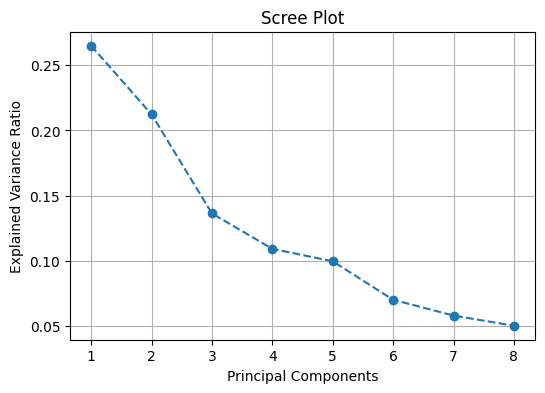

🏃 View run rare-yak-923 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/cfa6476a5760452799bd79a77a838ced
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0
Number of components to retain for 95% explained variance: 8


In [141]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import mlflow
import mlflow.sklearn

# Assuming 'df' is the original dataset

# Step 1: Preprocess Data (Imputation and Scaling)
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Handle missing data
imputer = SimpleImputer(strategy="mean")
X_imputed = imputer.fit_transform(X)

# Standardize the features (important for PCA)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Step 2: Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Step 3: Explained Variance
explained_variance = pca.explained_variance_ratio_

# Log results on MLFlow
with mlflow.start_run():
    mlflow.log_param("n_components", X_pca.shape[1])
    mlflow.log_param("explained_variance_ratio", explained_variance.tolist())
    
    # Step 4: Create the Scree Plot
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
    plt.title("Scree Plot")
    plt.xlabel("Principal Components")
    plt.ylabel("Explained Variance Ratio")
    plt.grid(True)
    
    # Save the plot first
    plt.savefig("scree_plot.png")
    
    # Log the plot after saving
    mlflow.log_artifact("scree_plot.png", "plots")
    
    # Show the plot
    plt.show()

    # Step 5: Select the number of components based on explained variance
    cumulative_variance = np.cumsum(explained_variance)
    n_components_to_select = np.where(cumulative_variance >= 0.95)[0][0] + 1  # Selecting components that explain at least 95% variance

    mlflow.log_param("n_components_selected", n_components_to_select)

    # Log the explained variance for each component
    mlflow.log_metric("explained_variance_at_95_percent", cumulative_variance[n_components_to_select - 1])

# Print the result and the selected components
print(f"Number of components to retain for 95% explained variance: {n_components_to_select}")



## EXPERIMENT 6


Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.83      0.90      0.86        80
           1       0.78      0.65      0.71        43

    accuracy                           0.81       123
   macro avg       0.80      0.78      0.79       123
weighted avg       0.81      0.81      0.81       123


Confusion Matrix on Test Data:
[[72  8]
 [15 28]]


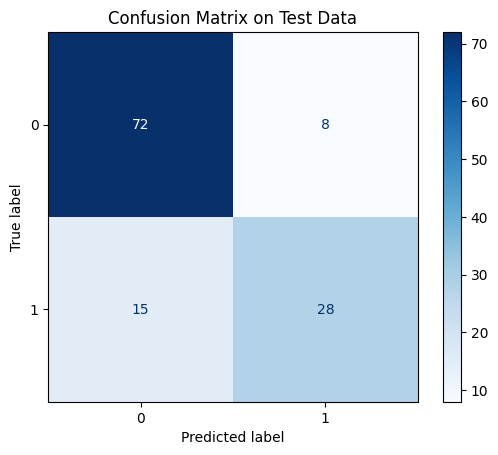

🏃 View run fun-elk-896 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/36b64ce219b04e38a241efe32098d256
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


In [142]:
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import mlflow
import mlflow.sklearn
import matplotlib.pyplot as plt

# Assuming 'df' is the original dataset
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Step 1: Preprocess the Data (Imputation and Scaling)
# Handle missing data
imputer = SimpleImputer(strategy="mean")
X_imputed = imputer.fit_transform(X)

# Standardize the features (important for SVC)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Step 2: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

# Step 3: Initialize the SVC Model
svc = SVC(random_state=42)

# Step 4: Start the MLFlow Run
with mlflow.start_run():

    # Train the model
    svc.fit(X_train, y_train)
    
    # Step 5: Predictions and Metrics on Test Data
    y_test_pred = svc.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred)
    recall = recall_score(y_test, y_test_pred)
    f1 = f1_score(y_test, y_test_pred)
    
    # Step 6: Log Parameters and Metrics to MLFlow
    mlflow.log_param("kernel", "rbf")  # SVC kernel type
    mlflow.log_param("C", svc.C)  # Regularization parameter
    mlflow.log_param("gamma", svc.gamma)  # Kernel coefficient
    
    mlflow.log_metric("accuracy", accuracy)
    mlflow.log_metric("precision", precision)
    mlflow.log_metric("recall", recall)
    mlflow.log_metric("f1_score", f1)

    # Classification Report
    print("\nClassification Report on Test Data:")
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix
    cm_test = confusion_matrix(y_test, y_test_pred)
    print("\nConfusion Matrix on Test Data:")
    print(cm_test)

    # Step 7: Log Confusion Matrix Plot
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=svc.classes_)
    disp.plot(cmap="Blues")
    disp.ax_.set_title("Confusion Matrix on Test Data")

    # Save the plot
    plt.savefig("svc_confusion_matrix.png")
    mlflow.log_artifact("svc_confusion_matrix.png", "plots")
    
    # Show the plot
    plt.show()


## EXPERIMENT 7


Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.83      0.90      0.86        80
           1       0.78      0.65      0.71        43

    accuracy                           0.81       123
   macro avg       0.80      0.78      0.79       123
weighted avg       0.81      0.81      0.81       123


Confusion Matrix on Test Data:
[[72  8]
 [15 28]]


<Figure size 1200x800 with 0 Axes>

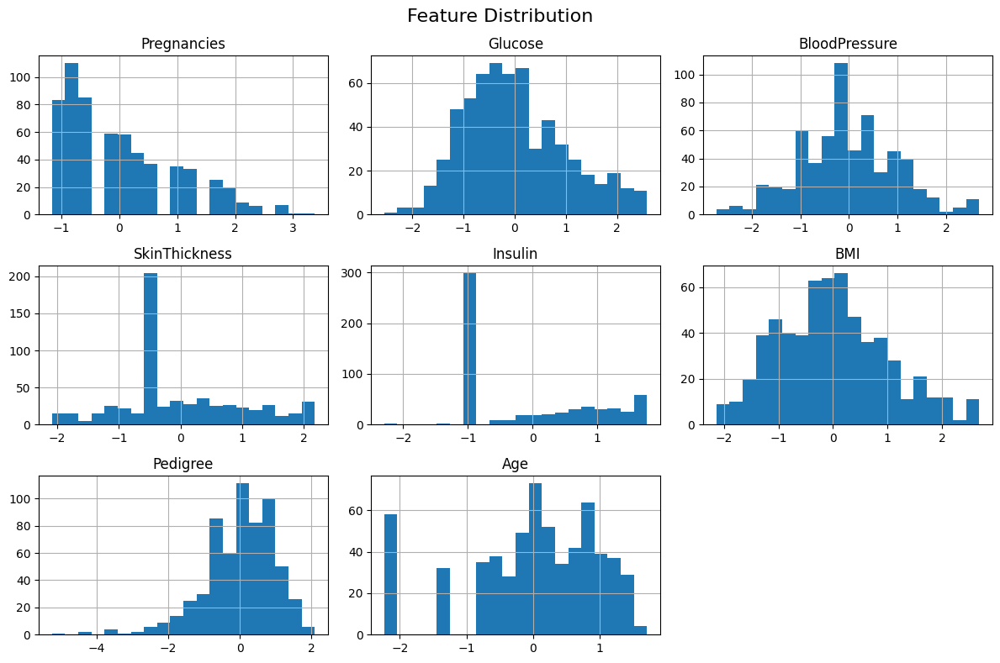

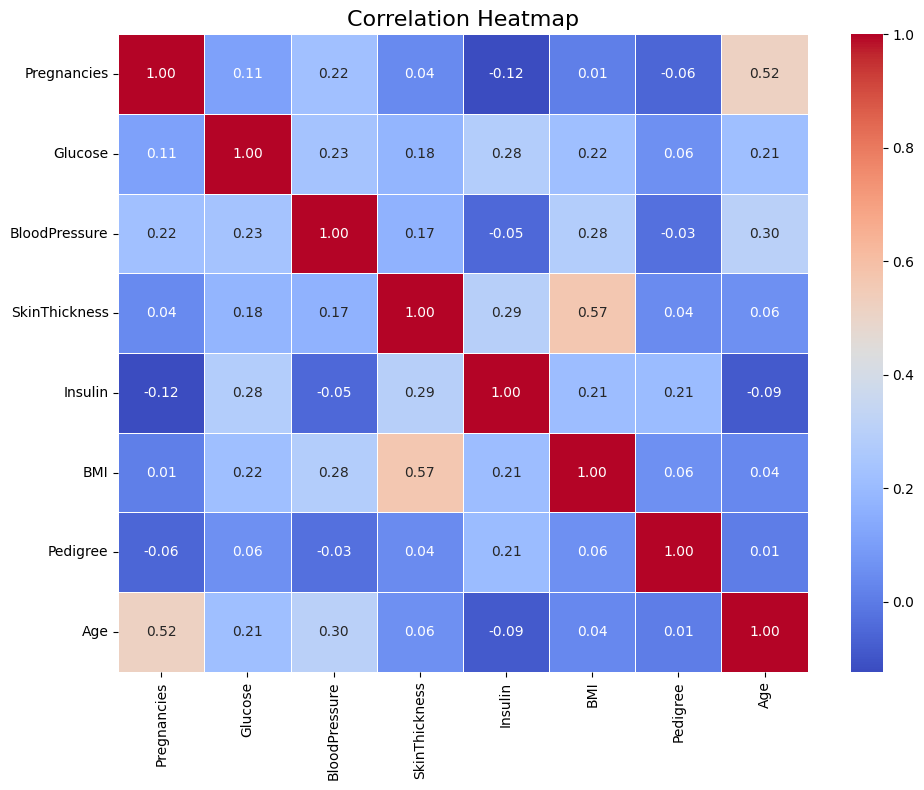

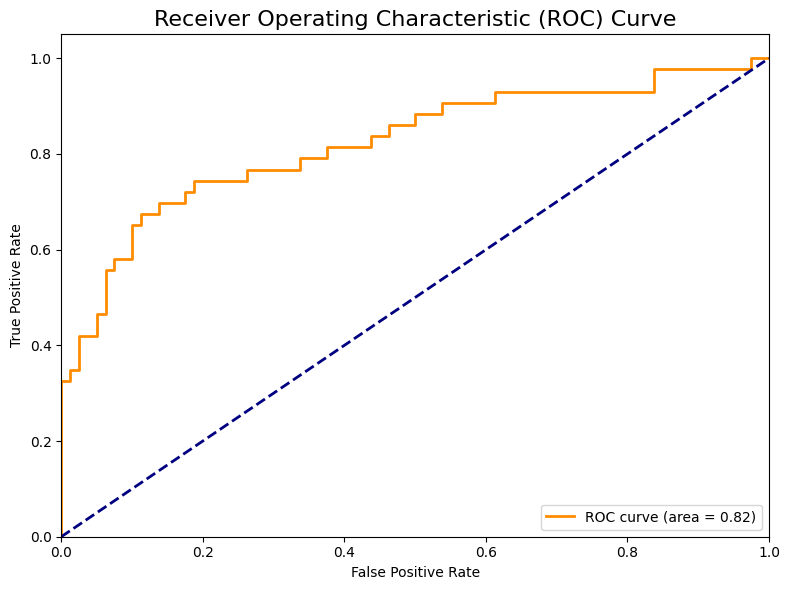

🏃 View run luxuriant-shad-95 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/1b80c8ac698344a89751d015e1a3d71d
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


In [143]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, auc
import mlflow
import mlflow.sklearn
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Assuming 'df' is the original dataset
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns
y = df["DiabetesPred"]  # Target variable

# Step 1: Preprocess the Data (Imputation and Scaling)
imputer = SimpleImputer(strategy="mean")
X_imputed = imputer.fit_transform(X)

# Standardize the features (important for SVC)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Step 2: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

# Step 3: Initialize the SVC Model
svc = SVC(random_state=42, probability=True)

# Step 4: Start the MLFlow Run
with mlflow.start_run():
    
    # Train the model
    svc.fit(X_train, y_train)
    
    # Step 5: Predictions and Metrics on Test Data
    y_test_pred = svc.predict(X_test)
    accuracy = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred)
    recall = recall_score(y_test, y_test_pred)
    f1 = f1_score(y_test, y_test_pred)
    
    # Step 6: Log Parameters and Metrics to MLFlow
    mlflow.log_param("kernel", "rbf")  # SVC kernel type
    mlflow.log_param("C", svc.C)  # Regularization parameter
    mlflow.log_param("gamma", svc.gamma)  # Kernel coefficient
    
    mlflow.log_metric("accuracy", accuracy)
    mlflow.log_metric("precision", precision)
    mlflow.log_metric("recall", recall)
    mlflow.log_metric("f1_score", f1)
    
    # Classification Report
    print("\nClassification Report on Test Data:")
    print(classification_report(y_test, y_test_pred))
    
    # Confusion Matrix
    cm_test = confusion_matrix(y_test, y_test_pred)
    print("\nConfusion Matrix on Test Data:")
    print(cm_test)
    
    # Step 7: Visualize Helpful Plots

    # Feature Distribution - Histograms for each feature
    plt.figure(figsize=(12, 8))
    X_df = pd.DataFrame(X_scaled, columns=X.columns)
    X_df.hist(bins=20, figsize=(12, 8))
    plt.suptitle('Feature Distribution', fontsize=16)
    plt.tight_layout()
    plt.savefig("feature_distribution.png")
    mlflow.log_artifact("feature_distribution.png", "plots")
    plt.show()

    # Correlation Heatmap
    plt.figure(figsize=(10, 8))
    corr = X_df.corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title("Correlation Heatmap", fontsize=16)
    plt.tight_layout()
    plt.savefig("correlation_heatmap.png")
    mlflow.log_artifact("correlation_heatmap.png", "plots")
    plt.show()

    # ROC Curve - Model Performance
    fpr, tpr, _ = roc_curve(y_test, svc.predict_proba(X_test)[:, 1])
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig("roc_curve.png")
    mlflow.log_artifact("roc_curve.png", "plots")
    plt.show()


## EXPERIMENT 8

🏃 View run agreeable-ram-134 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/21d8978b999f4a219b53952ebb34c4cb
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


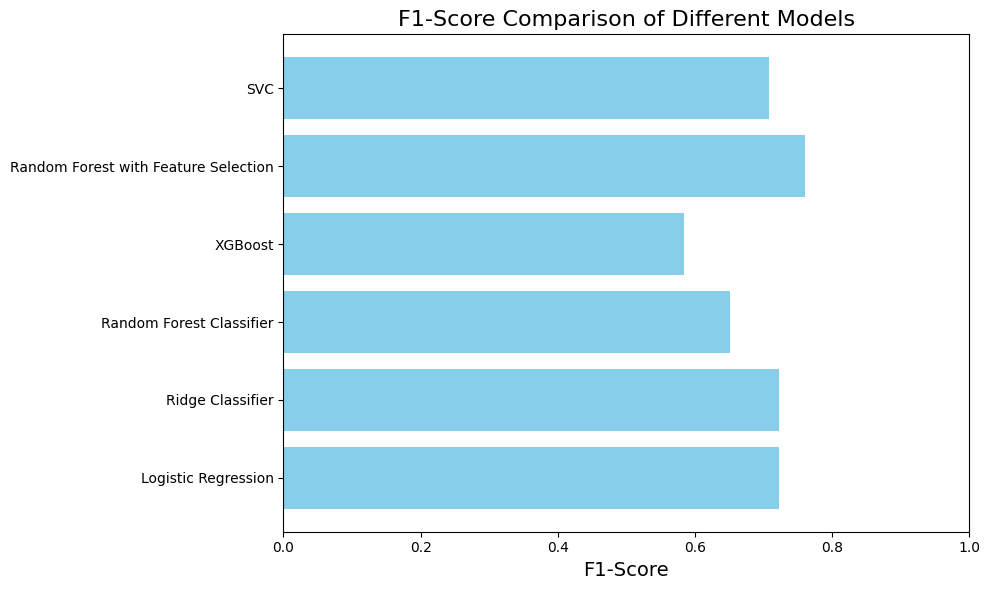

🏃 View run receptive-calf-382 at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0/runs/a328aec3744a4ac8a63bd61e55424102
🧪 View experiment at: https://dagshub.com/C-bundele/Diabetes-EAS.mlflow/#/experiments/0


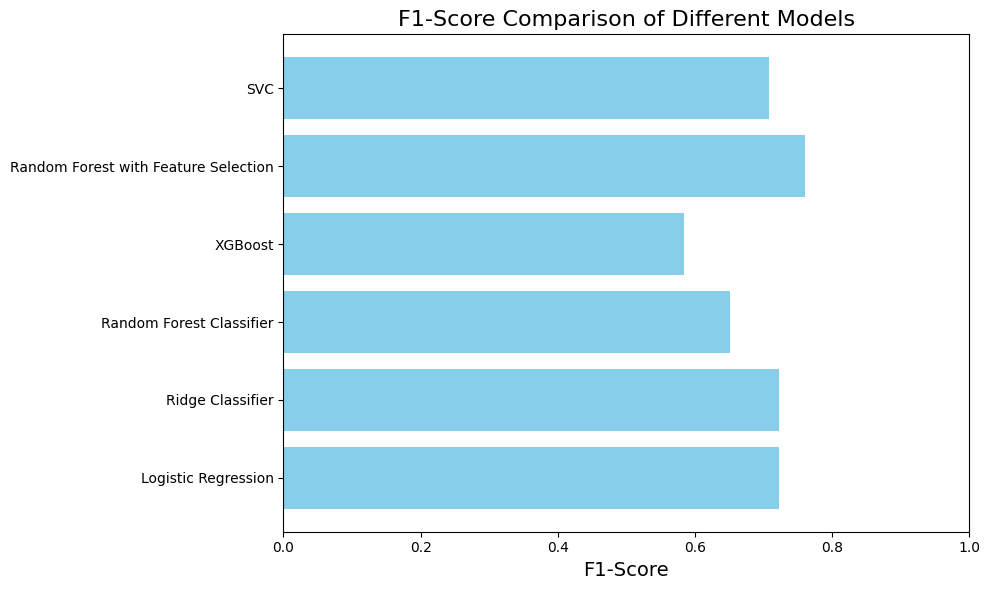

In [144]:
import matplotlib.pyplot as plt
import mlflow

# Model names and corresponding F1-scores
models = [
    "Logistic Regression",
    "Ridge Classifier",
    "Random Forest Classifier",
    "XGBoost",
    "Random Forest with Feature Selection",
    "SVC"
]

f1_scores = [
    0.7229,  # Logistic Regression F1-Score
    0.7229,  # Ridge Classifier F1-Score
    0.6512,  # Random Forest Classifier F1-Score
    0.5843,  # XGBoost F1-Score
    0.7605,  # Random Forest with Feature Selection F1-Score (calculated from classification report)
    0.7089   # SVC F1-Score
]

# Create the bar plot for F1-scores
plt.figure(figsize=(10, 6))
plt.barh(models, f1_scores, color='skyblue')
plt.xlabel("F1-Score", fontsize=14)
plt.title("F1-Score Comparison of Different Models", fontsize=16)
plt.xlim(0, 1)
plt.tight_layout()

# Save the plot as an image
plt.savefig("f1_score_comparison.png")

# Log the F1-score plot as an artifact in MLFlow
with mlflow.start_run():
    mlflow.log_artifact("f1_score_comparison.png", "plots")

# Display the plot
plt.show()
import matplotlib.pyplot as plt
import mlflow

# Model names and corresponding F1-scores
models = [
    "Logistic Regression",
    "Ridge Classifier",
    "Random Forest Classifier",
    "XGBoost",
    "Random Forest with Feature Selection",
    "SVC"
]

f1_scores = [
    0.7229,  # Logistic Regression F1-Score
    0.7229,  # Ridge Classifier F1-Score
    0.6512,  # Random Forest Classifier F1-Score
    0.5843,  # XGBoost F1-Score
    0.7605,  # Random Forest with Feature Selection F1-Score (calculated from classification report)
    0.7089   # SVC F1-Score
]

# Create the bar plot for F1-scores
plt.figure(figsize=(10, 6))
plt.barh(models, f1_scores, color='skyblue')
plt.xlabel("F1-Score", fontsize=14)
plt.title("F1-Score Comparison of Different Models", fontsize=16)
plt.xlim(0, 1)
plt.tight_layout()

# Save the plot as an image
plt.savefig("f1_score_comparison.png")

# Log the F1-score plot as an artifact in MLFlow
with mlflow.start_run():
    mlflow.log_artifact("f1_score_comparison.png", "plots")

# Display the plot
plt.show()


## Streamlit

In [ ]:
def predict_diabetes(user_input, model, imputer):
    """
    Predict whether a patient has diabetes or not based on user input.
    
    Parameters:
    - user_input (dict): Dictionary containing user inputs for all features.
    - model: Trained logistic regression model.
    - imputer: Trained imputer to handle missing values.
    
    Returns:
    - str: Prediction result ("Diabetes" or "No Diabetes").
    """
    # Convert user input dictionary to a DataFrame
    input_df = pd.DataFrame([user_input])
    
    # Impute missing values
    input_imputed = imputer.transform(input_df)
    
    # Predict using the trained model
    prediction = model.predict(input_imputed)
    
    # Return the result
    return "Diabetes" if prediction[0] == 1 else "No Diabetes"

# Example usage:
# Define the user input (keys should match feature names in the dataset)
user_input = {
    "Pregnancies": 3,
    "Glucose": 120,
    "BloodPressure": 70,
    "SkinThickness": 20,
    "Insulin": 85,
    "BMI": 28.5,
    "Pedigree": 0.5,
    "Age": 35
}

# Call the prediction function
result = predict_diabetes(user_input, best_model, imputer)

print(f"Prediction for the input patient data: {result}")


[3,120,70,20,85,28.5,0.5,35]

In [154]:
import joblib

joblib.dump(log_reg, 'diabetes-model.pkl')

['diabetes-model.pkl']

In [156]:
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# Sample dataset for demonstration
X = df.drop(columns=["PatientID", "DiabetesPred"])
y = df["DiabetesPred"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train the model
model = LogisticRegression(max_iter=500, random_state=42)
model.fit(X_train, y_train)

# Save the trained model
joblib.dump(model, "diabetes-model.pkl")

ValueError: Input X contains NaN.
LogisticRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [158]:
from sklearn.impute import SimpleImputer

# Create an imputer instance
imputer = SimpleImputer(strategy="median")  # You can also use 'median' or 'most_frequent'

# Impute missing values
X_imputed = imputer.fit_transform(X)

# Convert back to a DataFrame if needed
X = pd.DataFrame(X_imputed, columns=X.columns)

model = LogisticRegression(max_iter=500, random_state=42)
model.fit(X, y)

from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('model', LogisticRegression(max_iter=500, random_state=42))
])
pipeline.fit(X, y)



Pipeline(steps=[('imputer', SimpleImputer()),
                ('model', LogisticRegression(max_iter=500, random_state=42))])

In [160]:
joblib.dump(, "diabetes-model.pkl")

['diabetes-model.pkl']

In [168]:
import joblib
import numpy as np

model_ready = joblib.load('log.pkl')

user_input = np.array([0, 80, 70, 20, 85, 24.0, 0.3, 25]).reshape(1, -1)

predicted_prob = model.predict_proba(user_input)[:, 1]
threshold = 0.7  # Adjust threshold
predicted_value = int(predicted_prob > threshold)

if predicted_value == 1:
    diabetes_value = 'Diabetes Detected'
else:
    diabetes_value = 'No Diabetes'
print(predicted_value)

1


c:\Users\chanc\Desktop\ZIA FINAL PROJECT\EASF\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
C:\Users\chanc\AppData\Local\Temp\ipykernel_24856\3768615661.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  predicted_value = int(predicted_prob > threshold)


## new try

In [236]:
df.head(5)

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,Pedigree,Age,DiabetesPred
0,1,0.639947,0.866045,-0.030632,0.933847,-0.729820,0.181733,0.468492,1.425995,1
1,2,-0.844885,-1.205066,-0.543914,0.223108,-0.729820,-0.868800,-0.365061,-0.190672,0
2,3,1.233880,2.016662,-0.715008,-0.487630,-0.729820,-1.364051,0.604397,-0.105584,1
3,4,-0.844885,-1.073567,-0.543914,-0.487630,0.103101,-0.643686,-0.920763,-1.041549,0
4,5,-1.141852,0.504422,-2.768136,0.933847,1.073750,1.607456,5.484909,-0.020496,1


In [185]:
df_sorted = df.sort_values(by="PatientID", ascending=True)

# Display the sorted DataFrame
print(df_sorted)

     PatientID  Pregnancies   Glucose  BloodPressure  SkinThickness   Insulin  \
0            1     0.652466  0.896116      -0.023251       0.936068 -1.310866   
1            2    -0.861571 -1.192175      -0.530088       0.224676 -1.310866   
2            3     1.258082  2.056277      -0.699034      -0.486717 -1.310866   
3            4    -0.861571 -1.059585      -0.530088      -0.486717  0.087640   
4            5    -1.164379  0.531493      -2.726385       0.936068  0.717609   
..         ...          ...       ...            ...            ...       ...   
761        762     1.560889  1.625360       0.145695       0.461806 -1.310866   
762        763     1.560889 -1.059585      -0.867980      -0.486717 -1.310866   
764        765    -0.558764  0.034281      -0.192197      -0.012455 -1.310866   
766        767    -0.861571  0.166871      -1.036926      -0.486717 -1.310866   
767        768    -0.861571 -0.926996      -0.192197       0.461806 -1.310866   

          BMI  Pedigree    

In [244]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler  # Import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
import joblib

# Assuming you have your dataset in 'df' already (replace this with the actual loading method)
# df = pd.read_csv("your_dataset.csv")

# Separate features (X) and target variable (y)
X = df.drop(columns=["PatientID", "DiabetesPred"])  # Drop irrelevant columns like PatientID
y = df["DiabetesPred"]  # Target variable

# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy="median")  # Use median to replace missing values
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Apply Standard Scaling
scaler = StandardScaler()  # Initialize the scaler
X_train_scaled = scaler.fit_transform(X_train_imputed)  # Scale the training data
X_test_scaled = scaler.transform(X_test_imputed)  # Scale the test data

# Define and train Logistic Regression model
log_reg = LogisticRegression(random_state=42, max_iter=500)
log_reg.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = log_reg.predict(X_test_scaled)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data:", accuracy)
print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_pred))

# Save the trained model, imputer, and scaler as .pkl files
joblib.dump(log_reg, 'logistic_regression_model.pkl')
joblib.dump(imputer, 'imputer.pkl')
joblib.dump(scaler, 'scaler.pkl')  # Save the scaler as well

print("\nModel, Imputer, and Scaler saved as 'logistic_regression_model.pkl', 'imputer.pkl', and 'scaler.pkl'")


Accuracy on Test Data: 0.7662337662337663

Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.81      0.83      0.82        99
           1       0.68      0.65      0.67        55

    accuracy                           0.77       154
   macro avg       0.75      0.74      0.74       154
weighted avg       0.76      0.77      0.77       154


Model, Imputer, and Scaler saved as 'logistic_regression_model.pkl', 'imputer.pkl', and 'scaler.pkl'


In [245]:
import pandas as pd
import joblib
import numpy as np

# Load the saved model, imputer, and scaler
log_reg = joblib.load('logistic_regression_model.pkl')
imputer = joblib.load('imputer.pkl')
scaler = joblib.load('scaler.pkl')  # Load the scaler

# Simulate some new data for both diabetic and non-diabetic cases
new_data = pd.DataFrame({
    "Pregnancies": [3, 5, 2, 6],  # Both diabetic and non-diabetic cases
    "Glucose": [100, 120, 85, 170],
    "BloodPressure": [70, 80, 60, 90],
    "SkinThickness": [30, 40, 20, 50],
    "Insulin": [150, 200, 80, 250],
    "BMI": [25.0, 28.0, 22.5, 32.0],
    "Pedigree": [0.5, 0.6, 0.3, 0.8],
    "Age": [40, 50, 25, 60]
})

# Preprocess the new data (handle missing values)
new_data_imputed = imputer.transform(new_data)

# Scale the new data using the scaler
new_data_scaled = scaler.transform(new_data_imputed)

# Perform predictions
predictions = log_reg.predict(new_data_scaled)

# Display the predictions
print("Predictions:", predictions)

# Add the predictions to the DataFrame
new_data['PredictedDiabetes'] = predictions

# Display the new DataFrame with predictions
print(new_data)



Predictions: [1 1 1 1]
   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0            3      100             70             30      150  25.0   
1            5      120             80             40      200  28.0   
2            2       85             60             20       80  22.5   
3            6      170             90             50      250  32.0   

   Pedigree  Age  PredictedDiabetes  
0       0.5   40                  1  
1       0.6   50                  1  
2       0.3   25                  1  
3       0.8   60                  1  


In [243]:
print("Model coefficients:", log_reg.coef_)


Model coefficients: [[ 0.22063043  1.130063   -0.15343856  0.06026095 -0.20192052  0.7053587
   0.21491552  0.37613277]]


## Testing

In [1]:
import requests

# Define the API URL
url = "http://127.0.0.1:8000/predict"

# Define the input data
input_data = {
    "pregnancies": 0,
    "glucose": 20,
    "blood_pressure": 10,
    "skin_thickness": 5,
    "insulin": 10,
    "bmi": 5,
    "dpf": 0.1,
    "age": 12
}

# Send the POST request
response = requests.post(url, json=input_data)

# Check the response status and output
if response.status_code == 200:
    print("Prediction:", response.json()["prediction"])
else:
    print(f"Error: {response.status_code}, {response.text}")


Error: 500, {"detail":"Model, imputer, or scaler not loaded. Please ensure all files are available."}
